# House Price Prediction

In [1]:
import pandas as pd

# LOAD DATA

In [2]:
house=pd.read_csv('housepredict.csv')

In [3]:
house.head()

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
0,Owner,0,0,2,BHK,1300.236407,1,1,"Ksfc Layout,Bangalore",12.969910,77.597960,55.0
1,Dealer,0,0,2,BHK,1275.000000,1,1,"Vishweshwara Nagar,Mysore",12.274538,76.644605,51.0
2,Owner,0,0,2,BHK,933.159722,1,1,"Jigani,Bangalore",12.778033,77.632191,43.0
3,Owner,0,1,2,BHK,929.921143,1,1,"Sector-1 Vaishali,Ghaziabad",28.642300,77.344500,62.5
4,Dealer,1,0,2,BHK,999.009247,0,1,"New Town,Kolkata",22.592200,88.484911,60.5


In [4]:
house.tail()

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
29446,Owner,0,0,3,BHK,2500.000000,1,1,"Shamshabad Road,Agra",27.140626,78.043277,45.0
29447,Owner,0,0,2,BHK,769.230769,1,1,"E3-108, Lake View Recidency,,Vapi",39.945409,-86.150721,16.0
29448,Dealer,0,0,2,BHK,1022.641509,1,1,"Ajmer Road,Jaipur",26.928785,75.828002,27.1
29449,Owner,0,0,2,BHK,927.079009,1,1,"Sholinganallur,Chennai",12.900150,80.227910,67.0
29450,Dealer,0,1,2,BHK,896.774194,1,1,"Jagatpura,Jaipur",26.832353,75.841749,27.8


In [5]:
house.shape

(29451, 12)

In [6]:
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29451 entries, 0 to 29450
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   POSTED_BY              29451 non-null  object 
 1   UNDER_CONSTRUCTION     29451 non-null  int64  
 2   RERA                   29451 non-null  int64  
 3   BHK_NO.                29451 non-null  int64  
 4   BHK_OR_RK              29451 non-null  object 
 5   SQUARE_FT              29451 non-null  float64
 6   READY_TO_MOVE          29451 non-null  int64  
 7   RESALE                 29451 non-null  int64  
 8   ADDRESS                29451 non-null  object 
 9   LONGITUDE              29451 non-null  float64
 10  LATITUDE               29451 non-null  float64
 11  TARGET(PRICE_IN_LACS)  29451 non-null  float64
dtypes: float64(4), int64(5), object(3)
memory usage: 2.7+ MB


# 

# DATA CLEANING & CHECKING FOR NULL VALUES

In [7]:
house.drop('ADDRESS',inplace=True,axis=1)

In [8]:
house.head()

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
0,Owner,0,0,2,BHK,1300.236407,1,1,12.969910,77.597960,55.0
1,Dealer,0,0,2,BHK,1275.000000,1,1,12.274538,76.644605,51.0
2,Owner,0,0,2,BHK,933.159722,1,1,12.778033,77.632191,43.0
3,Owner,0,1,2,BHK,929.921143,1,1,28.642300,77.344500,62.5
4,Dealer,1,0,2,BHK,999.009247,0,1,22.592200,88.484911,60.5


In [9]:
house['POSTED_BY']

0         Owner
1        Dealer
2         Owner
3         Owner
4        Dealer
          ...  
29446     Owner
29447     Owner
29448    Dealer
29449     Owner
29450    Dealer
Name: POSTED_BY, Length: 29451, dtype: object

In [10]:
house['POSTED_BY'].value_counts()

Dealer     18291
Owner      10538
Builder      622
Name: POSTED_BY, dtype: int64

In [11]:
house['UNDER_CONSTRUCTION']

0        0
1        0
2        0
3        0
4        1
        ..
29446    0
29447    0
29448    0
29449    0
29450    0
Name: UNDER_CONSTRUCTION, Length: 29451, dtype: int64

In [12]:
house[['POSTED_BY','READY_TO_MOVE','TARGET(PRICE_IN_LACS)']]

,POSTED_BY,READY_TO_MOVE,TARGET(PRICE_IN_LACS)
0,Owner,1,55.0
1,Dealer,1,51.0
2,Owner,1,43.0
3,Owner,1,62.5
4,Dealer,0,60.5
...,...,...,...
29446,Owner,1,45.0
29447,Owner,1,16.0
29448,Dealer,1,27.1
29449,Owner,1,67.0


In [13]:
house.loc[2]

POSTED_BY                     Owner
UNDER_CONSTRUCTION                0
RERA                              0
BHK_NO.                           2
BHK_OR_RK                       BHK
SQUARE_FT                933.159722
READY_TO_MOVE                     1
RESALE                            1
LONGITUDE                 12.778033
LATITUDE                  77.632191
TARGET(PRICE_IN_LACS)          43.0
Name: 2, dtype: object

In [14]:
house.loc[[0,47,100,500,2000],['POSTED_BY','READY_TO_MOVE','BHK_OR_RK','TARGET(PRICE_IN_LACS)']]

,POSTED_BY,READY_TO_MOVE,BHK_OR_RK,TARGET(PRICE_IN_LACS)
0,Owner,1,BHK,55.0
47,Dealer,1,RK,46.0
100,Owner,0,BHK,50.0
500,Dealer,0,BHK,36.9
2000,Builder,0,BHK,34.9


In [15]:
house['BHK_OR_RK'].unique()

array(['BHK', 'RK'], dtype=object)

In [16]:
house[house['BHK_OR_RK']=='RK']

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
47,Dealer,0,0,1,RK,475.010326,1,1,24.690280,78.418890,46.0
2373,Dealer,0,0,1,RK,350.009052,1,1,24.690280,78.418890,58.0
2685,Dealer,1,0,1,RK,400.000000,0,1,19.216097,72.821721,45.0
5623,Owner,0,0,1,RK,375.006335,1,1,19.235000,72.859800,74.0
8455,Dealer,0,0,1,RK,450.045005,1,1,19.049989,73.077321,30.0
9156,Dealer,1,0,1,RK,196.942082,0,1,19.147866,72.932609,38.9
11853,Dealer,0,0,1,RK,350.008077,1,1,22.720512,75.834224,65.0
13666,Dealer,1,1,1,RK,440.000000,0,1,24.690280,78.418890,22.0
14124,Dealer,1,1,1,RK,449.982693,0,1,19.175900,72.952200,65.0
14400,Dealer,0,0,1,RK,360.023041,1,1,24.690280,78.418890,50.0


In [17]:
house[house['BHK_OR_RK']=='RK'].shape

(24, 11)

In [18]:
house['BHK_OR_RK'].value_counts()

BHK    29427
RK        24
Name: BHK_OR_RK, dtype: int64

In [19]:
house[house['TARGET(PRICE_IN_LACS)']<15]

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
29,Dealer,0,0,2,BHK,1000.000000,1,1,28.210200,76.860600,12.5
128,Owner,0,1,2,BHK,398.262129,1,1,26.707154,80.982346,11.0
138,Owner,0,0,1,BHK,410.067873,1,1,28.568846,77.324966,14.5
230,Builder,1,0,1,BHK,300.026089,0,0,24.690280,78.418890,11.5
267,Owner,0,0,1,BHK,451.030928,1,1,28.689982,77.339807,14.0
...,...,...,...,...,...,...,...,...,...,...,...
29273,Owner,0,0,2,BHK,675.046555,1,1,22.300000,73.200000,14.5
29307,Owner,0,0,1,BHK,350.000000,1,1,22.569754,70.188523,10.5
29308,Builder,1,1,1,BHK,90.252708,0,0,18.454300,73.114700,2.0
29321,Dealer,0,1,1,BHK,649.641577,1,1,30.662283,76.822397,14.5


In [20]:
house.describe()

,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,READY_TO_MOVE,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
count,29451.000000,29451.000000,29451.000000,2.945100e+04,29451.000000,29451.000000,29451.000000,29451.000000,29451.000000
mean,0.179756,0.317918,2.392279,1.980217e+04,0.820244,0.929578,21.300255,76.837695,142.898746
std,0.383991,0.465675,0.879091,1.901335e+06,0.383991,0.255861,6.205306,10.557747,656.880713
min,0.000000,0.000000,1.000000,3.000000e+00,0.000000,0.000000,-37.713008,-121.761248,0.250000
25%,0.000000,0.000000,2.000000,9.000211e+02,1.000000,1.000000,18.452663,73.798100,38.000000
50%,0.000000,0.000000,2.000000,1.175057e+03,1.000000,1.000000,20.750000,77.324137,62.000000
75%,0.000000,1.000000,3.000000,1.550688e+03,1.000000,1.000000,26.900926,77.828740,100.000000
max,1.000000,1.000000,20.000000,2.545455e+08,1.000000,1.000000,59.912884,152.962676,30000.000000


In [21]:
house.isnull().sum()

POSTED_BY                0
UNDER_CONSTRUCTION       0
RERA                     0
BHK_NO.                  0
BHK_OR_RK                0
SQUARE_FT                0
READY_TO_MOVE            0
RESALE                   0
LONGITUDE                0
LATITUDE                 0
TARGET(PRICE_IN_LACS)    0
dtype: int64

In [22]:
house.select_dtypes('object')

,POSTED_BY,BHK_OR_RK
0,Owner,BHK
1,Dealer,BHK
2,Owner,BHK
3,Owner,BHK
4,Dealer,BHK
...,...,...
29446,Owner,BHK
29447,Owner,BHK
29448,Dealer,BHK
29449,Owner,BHK


In [23]:
house.select_dtypes('number')

,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,READY_TO_MOVE,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
0,0,0,2,1300.236407,1,1,12.969910,77.597960,55.0
1,0,0,2,1275.000000,1,1,12.274538,76.644605,51.0
2,0,0,2,933.159722,1,1,12.778033,77.632191,43.0
3,0,1,2,929.921143,1,1,28.642300,77.344500,62.5
4,1,0,2,999.009247,0,1,22.592200,88.484911,60.5
...,...,...,...,...,...,...,...,...,...
29446,0,0,3,2500.000000,1,1,27.140626,78.043277,45.0
29447,0,0,2,769.230769,1,1,39.945409,-86.150721,16.0
29448,0,0,2,1022.641509,1,1,26.928785,75.828002,27.1
29449,0,0,2,927.079009,1,1,12.900150,80.227910,67.0


# CONVERTING CATEGORICAL TO NUMERICAL DATA

In [24]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
house["BHK_OR_RK"]=le.fit_transform(house["BHK_OR_RK"])
house["POSTED_BY"]=le.fit_transform(house["POSTED_BY"])
house.head()

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
0,2,0,0,2,0,1300.236407,1,1,12.969910,77.597960,55.0
1,1,0,0,2,0,1275.000000,1,1,12.274538,76.644605,51.0
2,2,0,0,2,0,933.159722,1,1,12.778033,77.632191,43.0
3,2,0,1,2,0,929.921143,1,1,28.642300,77.344500,62.5
4,1,1,0,2,0,999.009247,0,1,22.592200,88.484911,60.5


# DATA VISUALIZATION

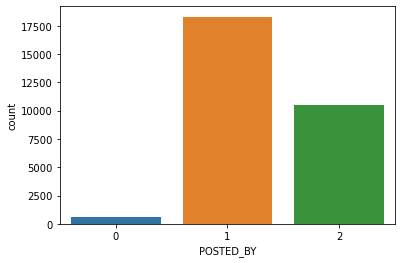

In [25]:
import seaborn as sns
sns.countplot(x='POSTED_BY', data=house);

In [26]:
import plotly.express as px
fig = px.parallel_coordinates(house, color="TARGET(PRICE_IN_LACS)",
                              dimensions=['POSTED_BY', 'UNDER_CONSTRUCTION', 'RERA','BHK_NO.','BHK_OR_RK', 'SQUARE_FT','READY_TO_MOVE','RESALE','LONGITUDE','LATITUDE'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

In [27]:
%matplotlib inline

In [28]:
import matplotlib.pyplot as plt

array([[<AxesSubplot:title={'center':'POSTED_BY'}>,
        <AxesSubplot:title={'center':'UNDER_CONSTRUCTION'}>,
        <AxesSubplot:title={'center':'RERA'}>],
       [<AxesSubplot:title={'center':'BHK_NO.'}>,
        <AxesSubplot:title={'center':'BHK_OR_RK'}>,
        <AxesSubplot:title={'center':'SQUARE_FT'}>],
       [<AxesSubplot:title={'center':'READY_TO_MOVE'}>,
        <AxesSubplot:title={'center':'RESALE'}>,
        <AxesSubplot:title={'center':'LONGITUDE'}>],
       [<AxesSubplot:title={'center':'LATITUDE'}>,
        <AxesSubplot:title={'center':'TARGET(PRICE_IN_LACS)'}>,
        <AxesSubplot:>]], dtype=object)

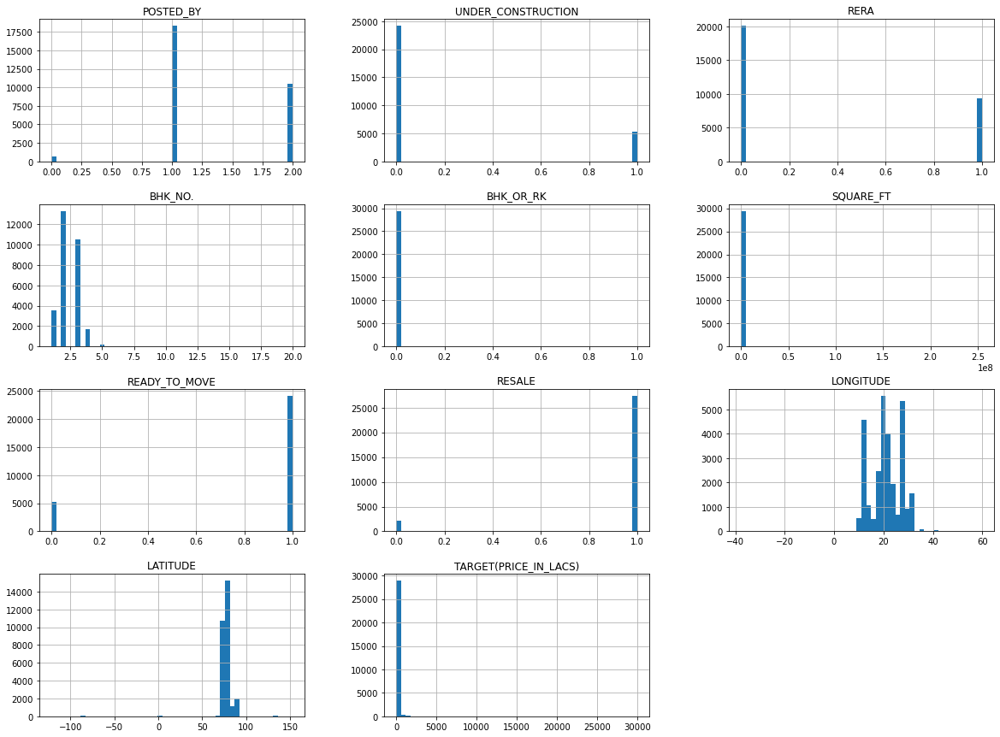

In [29]:
house.hist(bins=50, figsize=(20,15))

In [30]:
house.drop(house[house['TARGET(PRICE_IN_LACS)'] > 15000].index,inplace=True)
house.drop(house[house['LATITUDE'] > 150 ].index,inplace=True)
house.drop(house[house['LONGITUDE'] > 60 ].index,inplace=True)

array([[<AxesSubplot:title={'center':'POSTED_BY'}>,
        <AxesSubplot:title={'center':'UNDER_CONSTRUCTION'}>,
        <AxesSubplot:title={'center':'RERA'}>],
       [<AxesSubplot:title={'center':'BHK_NO.'}>,
        <AxesSubplot:title={'center':'BHK_OR_RK'}>,
        <AxesSubplot:title={'center':'SQUARE_FT'}>],
       [<AxesSubplot:title={'center':'READY_TO_MOVE'}>,
        <AxesSubplot:title={'center':'RESALE'}>,
        <AxesSubplot:title={'center':'LONGITUDE'}>],
       [<AxesSubplot:title={'center':'LATITUDE'}>,
        <AxesSubplot:title={'center':'TARGET(PRICE_IN_LACS)'}>,
        <AxesSubplot:>]], dtype=object)

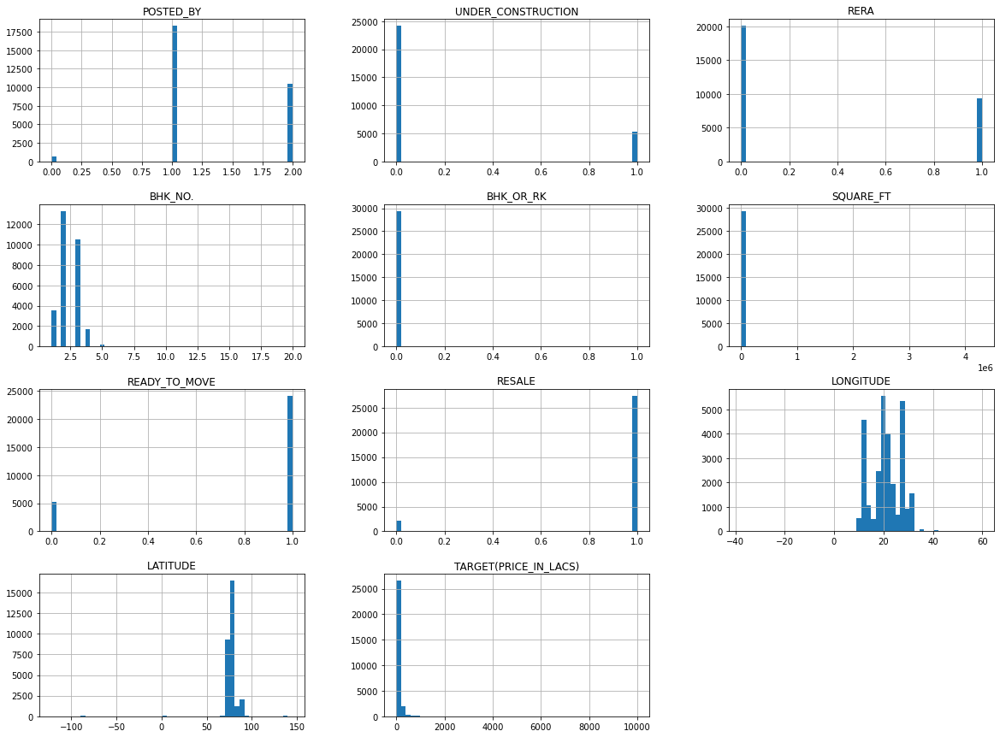

In [31]:
house.hist(bins=50, figsize=(20,15))

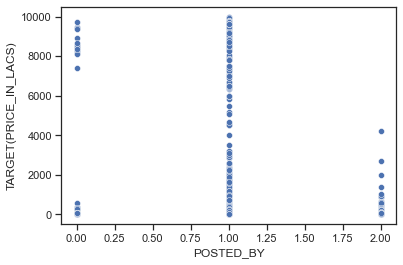

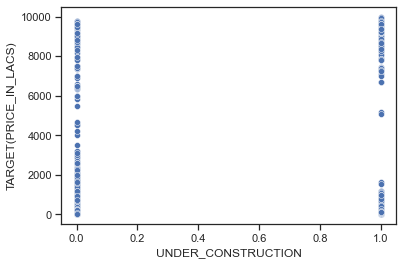

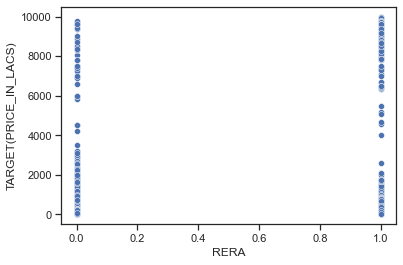

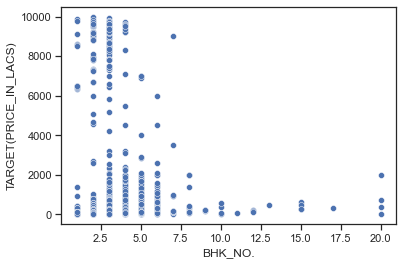

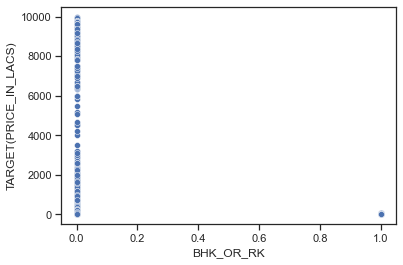

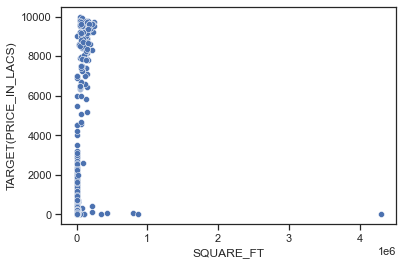

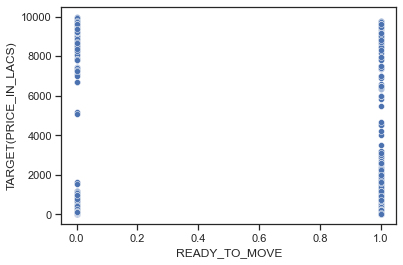

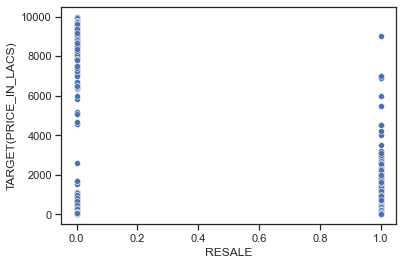

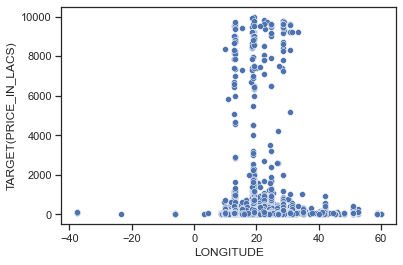

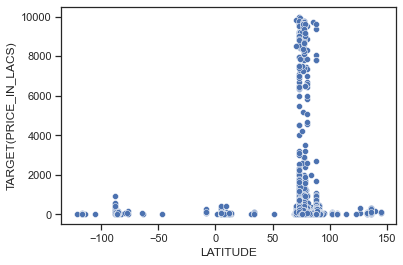

In [33]:
import seaborn as sns
sns.set(style="ticks")
for feature in house.columns:
    if feature != 'TARGET(PRICE_IN_LACS)':
        sns.scatterplot(x=feature, y='TARGET(PRICE_IN_LACS)', data=house)
        plt.show()

In [34]:
import plotly.express as px
fig = px.parallel_coordinates(house, color="TARGET(PRICE_IN_LACS)",
                              dimensions=['POSTED_BY', 'UNDER_CONSTRUCTION', 'RERA','BHK_NO.','BHK_OR_RK', 'SQUARE_FT','READY_TO_MOVE','RESALE','LONGITUDE','LATITUDE'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

# FEATURES CORRELATION

<AxesSubplot:>

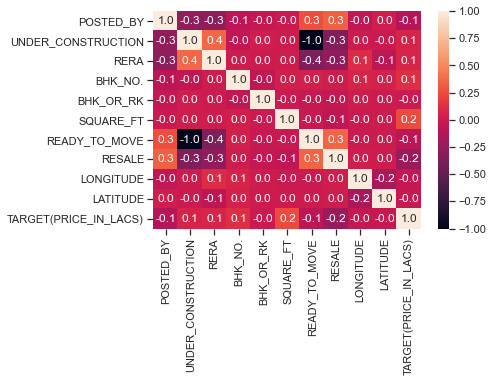

In [35]:
sns.heatmap(house.corr(),annot=True,fmt="0.1f")

In [36]:
house.drop(columns=['READY_TO_MOVE'], inplace=True)

<AxesSubplot:>

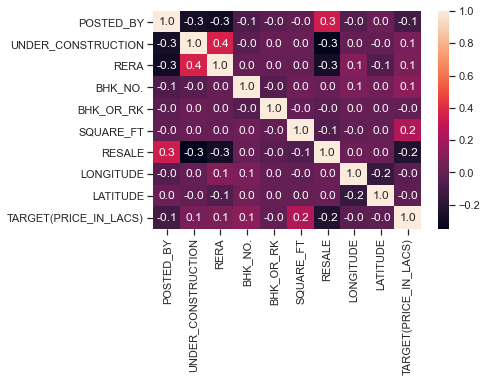

In [37]:
sns.heatmap(house.corr(),annot=True,fmt="0.1f")

In [38]:
house.drop(columns=['RERA'], inplace=True)

<AxesSubplot:>

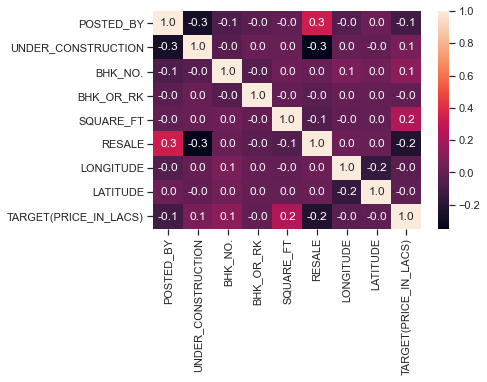

In [39]:
sns.heatmap(house.corr(),annot=True,fmt="0.1f")

In [40]:
X=house.iloc[:,:-1]
Y=house.iloc[:,-1]
X.head()

,POSTED_BY,UNDER_CONSTRUCTION,BHK_NO.,BHK_OR_RK,SQUARE_FT,RESALE,LONGITUDE,LATITUDE
0,2,0,2,0,1300.236407,1,12.969910,77.597960
1,1,0,2,0,1275.000000,1,12.274538,76.644605
2,2,0,2,0,933.159722,1,12.778033,77.632191
3,2,0,2,0,929.921143,1,28.642300,77.344500
4,1,1,2,0,999.009247,1,22.592200,88.484911


In [41]:
Y.head()

0    55.0
1    51.0
2    43.0
3    62.5
4    60.5
Name: TARGET(PRICE_IN_LACS), dtype: float64

# SPLITTING DATA-TRAIN & TEST

In [42]:
from sklearn.model_selection import train_test_split
x1,x2,y1,y2=train_test_split(X,Y,test_size=0.2,random_state=100)

In [43]:
x1.head()

,POSTED_BY,UNDER_CONSTRUCTION,BHK_NO.,BHK_OR_RK,SQUARE_FT,RESALE,LONGITUDE,LATITUDE
18018,1,0,2,0,530.018310,1,19.068492,72.898896
11219,1,1,3,0,1308.571429,1,23.398893,85.335374
14138,2,0,2,0,1199.040767,1,13.201247,77.580146
28825,1,1,2,0,903.024911,1,22.700000,88.450000
11260,2,0,2,0,1337.223438,1,28.671100,77.368300


In [44]:
y1.head()

18018    110.0
11219     45.8
14138     65.0
28825     20.3
11260     55.0
Name: TARGET(PRICE_IN_LACS), dtype: float64

In [45]:
x1.shape

(23557, 8)

In [46]:
y1.shape

(23557,)

# TRAINING MODEL

In [47]:
from sklearn.tree import DecisionTreeRegressor
dt=DecisionTreeRegressor()
dt.fit(x1,y1)

DecisionTreeRegressor()

In [48]:
dt.score(x2,y2)*100

96.02861863285935

In [49]:
yp=dt.predict(x2)

# VERIFICATION

In [50]:
house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29447 entries, 0 to 29450
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   POSTED_BY              29447 non-null  int32  
 1   UNDER_CONSTRUCTION     29447 non-null  int64  
 2   BHK_NO.                29447 non-null  int64  
 3   BHK_OR_RK              29447 non-null  int32  
 4   SQUARE_FT              29447 non-null  float64
 5   RESALE                 29447 non-null  int64  
 6   LONGITUDE              29447 non-null  float64
 7   LATITUDE               29447 non-null  float64
 8   TARGET(PRICE_IN_LACS)  29447 non-null  float64
dtypes: float64(4), int32(2), int64(3)
memory usage: 3.0 MB


In [52]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
POSTED_BY=int(input("Enter posted by:\n0 for Builder\n 1 for Dealer\n 2 for Owner\n"))
UNDER_CONSTRUCTION=int(input("Enter 1 if underconstructed else 0:\n"))
BHK_OR_RK=int(input("Enter 0 if bhk or  1 if rk:\n"))
BHK_NO=int(input("Enter no of bhk:\n"))
SQUARE_FT=float(input("Enter squareft:\n"))
RESALE=int(input("Enter 1 if resale else 0 :\n"))
LONGITUDE=float(input("Enter longitude:\n"))
LATITUDE=float(input("Enter latitude:\n"))
ypred=np.array([[POSTED_BY,UNDER_CONSTRUCTION,BHK_NO,BHK_OR_RK,SQUARE_FT,RESALE,LONGITUDE,LATITUDE]])
a=dt.predict(ypred)
print("Targetprice(lacs):",a)

Enter posted by:
0 for Builder
 1 for Dealer
 2 for Owner
1
Enter 1 if underconstructed else 0:
1
Enter 0 if bhk or  1 if rk:
0
Enter no of bhk:
3
Enter squareft:
1308.57
Enter 1 if resale else 0 :
1
Enter longitude:
23.39
Enter latitude:
85.33
Targetprice(lacs): [45.8]
